In [ ]:
#! rm -rf road_segmentation_ideal

In [1]:
! python -m tensorboard.main --logdir=/path/to/logs

2020-07-26 07:04:28.424312: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.2.2 at http://localhost:6006/ (Press CTRL+C to quit)


In [3]:
! wget "https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/maps.tar.gz"
! tar -xf maps.tar.gz > /dev/null

--2020-07-26 07:04:45--  https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/maps.tar.gz
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.189.73
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.189.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 250242400 (239M) [application/x-gzip]
Saving to: ‘maps.tar.gz’

maps.tar.gz         100%[===================>] 238.65M  70.9MB/s    in 3.6s    

2020-07-26 07:04:48 (65.4 MB/s) - ‘maps.tar.gz’ saved [250242400/250242400]



In [ ]:
# go over here "https://www.kaggle.com/insaff/massachusetts-roads-dataset" and extract the link
#! wget "https://storage.googleapis.com/kaggle-data-sets/341581%2F676539%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kaggle-161607.iam.gserviceaccount.com&Expires=1595957797&Signature=B0KMd3jITZkROBa0viL%2F1kTT8Uqtv6QD1bPt91BbBOort9qAfMWUZmbSltr17T7ysdaCizxf1z%2BM3qCFXg3eycozWxbK0sGFcO861P0Zlx8zBS0V62SG710FdubLF3XbDd1zVqJkMqsucWGO8895BmzXqH3V2S5vNDaehz8EVNugxVbZyiG95e3x8BEvmkfmACV8iv8OzhQPUnZaRutit9GGBcHEvvR1J8LjUPXST1NzU2Ps%2FBrIdIuRTqRmUkERvNYS2%2FmInkNQWOic95BT58SRFzo%2FOhNp3AD2EDcUpvYupuOWZEcSqQfQ%2FsHCXikaHfKJDto87pA6H7D%2FIzvVTQ%3D%3D" -O roads.zip

--2020-07-25 17:40:56--  https://storage.googleapis.com/kaggle-data-sets/341581%2F676539%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kaggle-161607.iam.gserviceaccount.com&Expires=1595957797&Signature=B0KMd3jITZkROBa0viL%2F1kTT8Uqtv6QD1bPt91BbBOort9qAfMWUZmbSltr17T7ysdaCizxf1z%2BM3qCFXg3eycozWxbK0sGFcO861P0Zlx8zBS0V62SG710FdubLF3XbDd1zVqJkMqsucWGO8895BmzXqH3V2S5vNDaehz8EVNugxVbZyiG95e3x8BEvmkfmACV8iv8OzhQPUnZaRutit9GGBcHEvvR1J8LjUPXST1NzU2Ps%2FBrIdIuRTqRmUkERvNYS2%2FmInkNQWOic95BT58SRFzo%2FOhNp3AD2EDcUpvYupuOWZEcSqQfQ%2FsHCXikaHfKJDto87pA6H7D%2FIzvVTQ%3D%3D
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.204.128, 64.233.189.128, 108.177.97.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.204.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5065090551 (4.7G) [application/zip]
Saving to: ‘roads.zip’

roads.zip           100%[===================>]   4.72G  52.4MB/s    in 2m 7s   

2020-07-25 17:43:03 (38

In [4]:
#! unzip -qq roads.zip
import os
import numpy as np
import cv2
from glob import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import Conv2D, Activation, BatchNormalization
from tensorflow.keras.layers import UpSampling2D, Input, Concatenate
from tensorflow.keras.models import Model , load_model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Recall, Precision 
from tensorflow.keras import backend as K


In [5]:
! mkdir train_mask
! mkdir train_images

In [6]:
import glob
png_files = glob.glob('maps/train/*.jpg')
print(len(png_files))

1096


In [7]:
print(png_files)
print(sorted(png_files))

['maps/train/504.jpg', 'maps/train/1030.jpg', 'maps/train/50.jpg', 'maps/train/790.jpg', 'maps/train/505.jpg', 'maps/train/501.jpg', 'maps/train/668.jpg', 'maps/train/209.jpg', 'maps/train/929.jpg', 'maps/train/593.jpg', 'maps/train/1050.jpg', 'maps/train/1039.jpg', 'maps/train/408.jpg', 'maps/train/750.jpg', 'maps/train/171.jpg', 'maps/train/869.jpg', 'maps/train/568.jpg', 'maps/train/555.jpg', 'maps/train/793.jpg', 'maps/train/144.jpg', 'maps/train/34.jpg', 'maps/train/492.jpg', 'maps/train/500.jpg', 'maps/train/160.jpg', 'maps/train/619.jpg', 'maps/train/478.jpg', 'maps/train/213.jpg', 'maps/train/1006.jpg', 'maps/train/680.jpg', 'maps/train/1017.jpg', 'maps/train/128.jpg', 'maps/train/662.jpg', 'maps/train/241.jpg', 'maps/train/100.jpg', 'maps/train/166.jpg', 'maps/train/257.jpg', 'maps/train/203.jpg', 'maps/train/883.jpg', 'maps/train/925.jpg', 'maps/train/5.jpg', 'maps/train/739.jpg', 'maps/train/8.jpg', 'maps/train/296.jpg', 'maps/train/854.jpg', 'maps/train/180.jpg', 'maps/trai

(600, 1200, 3)


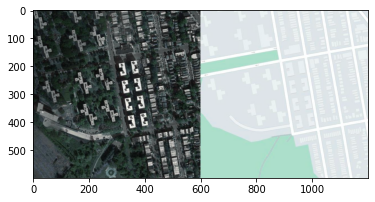

In [43]:
img = cv2.imread(png_files[1],cv2.IMREAD_UNCHANGED)
print(img.shape)
plt.imshow(img)
plt.show()

In [44]:
image1 = img[0:600,600:1200]
img = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY) 

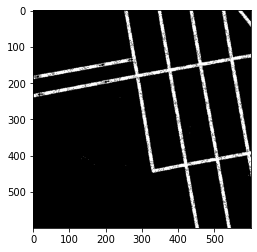

In [49]:
# applying Otsu thresholding 
# as an extra flag in binary  
# thresholding      
ret, thresh1 = cv2.threshold(img, 250, 255, cv2.THRESH_BINARY)      
plt.imshow(thresh1,cmap='gray')
plt.show()

In [50]:
from tqdm import tqdm
for item in tqdm(png_files):
  img = cv2.imread(item,cv2.IMREAD_UNCHANGED)
  im_name = str(item.split('.')[0]).split('/')[2]+".jpg"
  #print(im_name)
  img_or = img[0:600,0:600]
  img_mask = img[0:600,600:1200]
  img1 = cv2.cvtColor(img_mask, cv2.COLOR_BGR2GRAY) 
  ret, thresh1 = cv2.threshold(img1, 250, 255, cv2.THRESH_BINARY) 
  # plt.imshow(img_or)
  # plt.show()
  # plt.imshow(img_mask)
  # plt.show()
  #print(str("../train_mask/"+item))
  cv2.imwrite(str("train_mask/"+im_name), thresh1)
  cv2.imwrite(str("train_images/"+im_name), img_or)
  #break

100%|██████████| 1096/1096 [00:21<00:00, 50.31it/s]


In [ ]:
#os.path.exists('road_segmentation_ideal/training/input/img-10.png')

True

In [ ]:
#!ls road_segmentation_ideal/training/input/img-*.jpeg

ls: cannot access 'road_segmentation_ideal/training/input/img-*.jpeg': No such file or directory


In [ ]:
# # data cleaning
# import os.path
# from tqdm import tqdm
# for i in tqdm(range(1,1200)):
#   file_path_inp = 'road_segmentation_ideal/training/input/img-{}.png'.format(i)
#   if os.path.exists(file_path_inp) == True:
#     #print("OK")
#     file_path_out = 'road_segmentation_ideal/training/output/img-{}.png'.format(i)
#     if os.path.exists(file_path_out) == True:
#       #print("OK")
#       #print(i,"exists")
#       continue
#     elif os.path.exists(file_path_out) == False:
#       try:
#         os.remove(file_path_inp)
#       except:
#         pass
#   elif os.path.exists(file_path_inp) == False:
#     try:
#         os.remove(file_path_out)
#     except:
#       pass

100%|██████████| 1199/1199 [00:00<00:00, 30685.97it/s]


In [ ]:
import glob
png_files = glob.glob('road_segmentation_ideal/training/input/*.png')
print(png_files[0])
print(len(png_files))
# png_files.sort()
# print(png_files[:-1])

road_segmentation_ideal/training/input/img-898.png
802


(1500, 1500, 3)


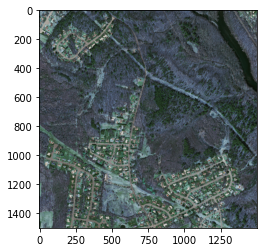

In [ ]:
#img = cv2.imread(png_files[0],cv2.IMREAD_UNCHANGED)
img = cv2.imread('road_segmentation_ideal/training/input/img-10.png',cv2.IMREAD_UNCHANGED)
print(img.shape)
plt.imshow(img)
plt.show()

In [ ]:
import glob
png_files = glob.glob('road_segmentation_ideal/training/output/*.png')
print(png_files[0])
print(len(png_files))

road_segmentation_ideal/training/output/img-898.png
683


(1500, 1500)


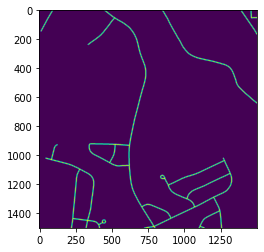

In [ ]:
img = cv2.imread('road_segmentation_ideal/training/output/img-10.png',cv2.IMREAD_UNCHANGED)
#img = cv2.imread(png_files[0],cv2.IMREAD_UNCHANGED)
print(img.shape)
plt.imshow(img)
plt.show()

In [51]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [52]:
np.random.seed(42)
tf.random.set_seed(42)

## Hyperparameters

IMG_SIZE = 256
EPOCHS = 30
BATCH = 32
LR = 1e-4


PATH = ''

In [53]:
def load_data(path, split=0.1):

  images_list = sorted(glob.glob(os.path.join(path, "train_images/*")))
  masks_list = sorted(glob.glob(os.path.join(path, "train_mask/*")))

  tot_size = len(images_list)
  val_size = int(split * tot_size)
  test_size = int(split * tot_size)

  x_train, x_val = train_test_split(images_list, test_size=val_size, random_state=42)
  y_train, y_val = train_test_split(masks_list, test_size=val_size, random_state=42)
  x_train, x_test = train_test_split(x_train, test_size=test_size, random_state=42)
  y_train, y_test = train_test_split(y_train, test_size=test_size, random_state=42)

  return (x_train, y_train), (x_val, y_val), (x_test, y_test)

In [54]:
def read_img(path):
    path = path.decode()
    tmp = cv2.imread(path, cv2.IMREAD_COLOR)
    tmp = cv2.resize(tmp, (IMG_SIZE, IMG_SIZE))
    tmp = tmp/255.0
    return tmp

def read_mask(path):
    path = path.decode()
    tmp = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    tmp = cv2.resize(tmp, (IMG_SIZE, IMG_SIZE))
    tmp = tmp/255.0
    tmp = np.expand_dims(tmp, axis=-1)
    return tmp

In [55]:
def tf_parse(a, b):
    def _parse(a, b):
        a = read_img(a)
        b = read_mask(b)
        return a, b

    a, b = tf.numpy_function(_parse, [a, b], [tf.float64, tf.float64])
    a.set_shape([IMG_SIZE, IMG_SIZE, 3])
    b.set_shape([IMG_SIZE, IMG_SIZE, 1])
    return a, b

def tf_dataset(a, b, batch=32):
    data = tf.data.Dataset.from_tensor_slices((a, b))
    data = data.map(tf_parse)
    data = data.batch(batch)
    data = data.repeat()
    return data

In [56]:

(x_train, y_train), (x_val, y_val), (x_test, y_test) = load_data("")

print("Training data: ", len(x_train))
print("Validation data: ", len(x_val))
print("Testing data: ", len(x_test))

Training data:  878
Validation data:  109
Testing data:  109


In [57]:
def read_and_rgb(a):
    a = cv2.imread(a)
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    return a

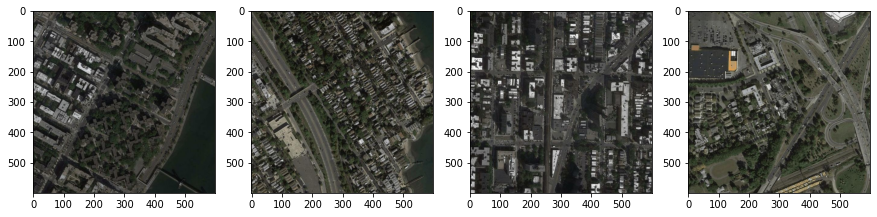

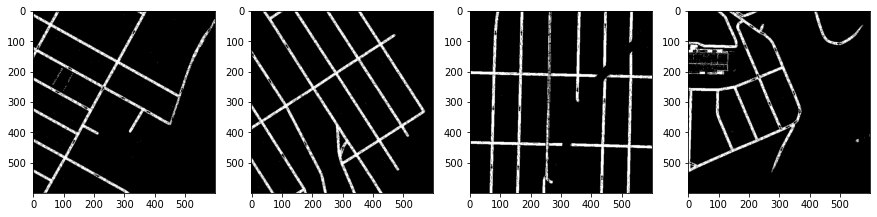

In [58]:
fig = plt.figure(figsize=(15, 15))
x = fig.add_subplot(1, 4, 1)
imgplot = plt.imshow(read_and_rgb(x_train[0]))

x = fig.add_subplot(1, 4, 2)
imgplot = plt.imshow(read_and_rgb(x_train[1]))
imgplot.set_clim(0.0, 0.7)

x = fig.add_subplot(1, 4, 3)
imgplot = plt.imshow(read_and_rgb(x_train[2]))
imgplot.set_clim(0.0, 1.4)

x = fig.add_subplot(1, 4, 4)
imgplot = plt.imshow(read_and_rgb(x_train[3]))
imgplot.set_clim(0.0, 2.1)

fig = plt.figure(figsize=(15, 15))
x = fig.add_subplot(1, 4, 1)
imgplot = plt.imshow(read_and_rgb(y_train[0]))

x = fig.add_subplot(1, 4, 2)
imgplot = plt.imshow(read_and_rgb(y_train[1]))
imgplot.set_clim(0.0, 0.7)

x = fig.add_subplot(1, 4, 3)
imgplot = plt.imshow(read_and_rgb(y_train[2]))
imgplot.set_clim(0.0, 1.4)

x = fig.add_subplot(1, 4, 4)
imgplot = plt.imshow(read_and_rgb(y_train[3]))
imgplot.set_clim(0.0, 1.4)

In [59]:
def model():
    inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3), name="input_image")
    
    encoder = MobileNetV2(input_tensor=inputs, weights="imagenet", include_top=False, alpha=0.50)
    skip_connection_list = ["input_image", "block_1_expand_relu", "block_3_expand_relu", "block_6_expand_relu"]
    encoder_output = encoder.get_layer("block_13_expand_relu").output
    
    fil = [48, 64, 96, 128]
    xt = encoder_output
    for i in range(1, len(skip_connection_list)+1, 1):
        xt_skip = encoder.get_layer(skip_connection_list[-i]).output
        xt = UpSampling2D((2, 2))(xt)
        xt = Concatenate()([xt, xt_skip])
        
        xt = Conv2D(fil[-i], (3, 3), padding="same")(xt)
        xt = BatchNormalization()(xt)
        xt = Activation("relu")(xt)
        
        xt = Conv2D(fil[-i], (3, 3), padding="same")(xt)
        xt = BatchNormalization()(xt)
        xt = Activation("relu")(xt)
        
    xt = Conv2D(1, (1, 1), padding="same")(xt)
    xt = Activation("sigmoid")(xt)
    
    model = Model(inputs, xt)
    return model

In [60]:
model = model()
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 257, 257, 3)  0           input_image[0][0]                
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 128, 128, 16) 432         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 128, 128, 16) 64          Conv1[0][0]                      
____________________________________________________________________________________________

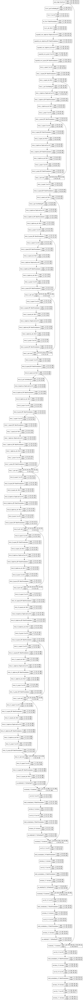

In [61]:
from tensorflow.keras.utils import  plot_model as pm  #plotting the model structure
pm(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True,dpi=60)

In [62]:
smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

In [63]:
train_data = tf_dataset(x_train, y_train, batch=BATCH)
valid_data = tf_dataset(x_val, y_val, batch=BATCH)

In [64]:
opt = tf.keras.optimizers.Nadam(LR)
metrics = [dice_coef, Recall(), Precision()]
model.compile(loss=dice_loss, optimizer=opt, metrics=metrics)

In [65]:
from datetime import datetime
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow import keras

# for storing logs into tensorboard
logdir="logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")


callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=False),
    ModelCheckpoint("./model_checkpoint", monitor='val_loss'),
    keras.callbacks.TensorBoard(log_dir=logdir)
]

In [66]:
train_steps = len(x_train)//BATCH
valid_steps = len(x_val)//BATCH

if len(x_train) % BATCH != 0:
    train_steps += 1
if len(x_val) % BATCH != 0:
    valid_steps += 1

In [67]:
history = model.fit(
    train_data,
    validation_data=valid_data,
    epochs=EPOCHS,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=callbacks
)

Epoch 1/30
28/28 [==============================] - 37s 1s/step - loss: 0.7683 - dice_coef: 0.2320 - recall_1: 0.6258 - precision_1: 0.3215 - val_loss: 0.8503 - val_dice_coef: 0.1522 - val_recall_1: 0.0163 - val_precision_1: 0.4949 - lr: 1.0000e-04
Epoch 2/30
28/28 [==============================] - 36s 1s/step - loss: 0.6597 - dice_coef: 0.3398 - recall_1: 0.7501 - precision_1: 0.4699 - val_loss: 0.8470 - val_dice_coef: 0.1567 - val_recall_1: 0.0882 - val_precision_1: 0.7212 - lr: 1.0000e-04
Epoch 3/30
28/28 [==============================] - 36s 1s/step - loss: 0.6093 - dice_coef: 0.3901 - recall_1: 0.7071 - precision_1: 0.5651 - val_loss: 0.8263 - val_dice_coef: 0.1778 - val_recall_1: 0.1314 - val_precision_1: 0.7863 - lr: 1.0000e-04
Epoch 4/30
28/28 [==============================] - 35s 1s/step - loss: 0.5747 - dice_coef: 0.4248 - recall_1: 0.6846 - precision_1: 0.6253 - val_loss: 0.7785 - val_dice_coef: 0.2265 - val_recall_1: 0.1976 - val_precision_1: 0.7882 - lr: 1.0000e-04
Epoc

### 30 epochs

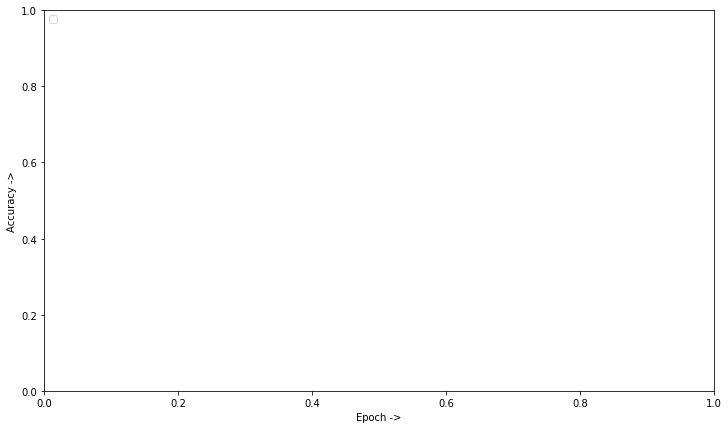

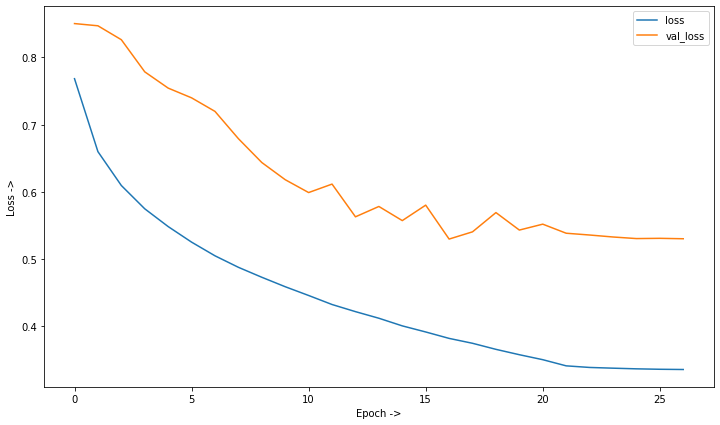

<Figure size 432x288 with 0 Axes>

In [69]:
from matplotlib import pyplot as plt
plt.figure(figsize=(12,7))
legend_acc = []
for item in history.history.keys():
  if item.split('_')[-1:] == ['acc']:
    #print("Accuracy = ",item)
    legend_acc.append(item)
    plt.plot(history.history[item])
plt.ylabel('Accuracy ->')
plt.xlabel('Epoch ->')
plt.legend(legend_acc, loc='upper left')
plt.show()

plt.figure(figsize=(12,7))
legend_acc = []
for item in history.history.keys():
  if item.split('_')[-1:] == ['loss']:
    #print("Accuracy = ",item)
    legend_acc.append(item)
    plt.plot(history.history[item])
plt.ylabel('Loss ->')
plt.xlabel('Epoch ->')
plt.legend(legend_acc, loc='upper right')
plt.show()
plt.savefig('acc_BuildingDetectionUNet.png')

In [29]:
model.save_weights("UNetMassaRoads_30e.h5")

model.save("UnetMassaRoads_with_weight_30e.h5")


In [30]:
# Run this module only while loading the pre-trained model.
model = load_model('UnetMassaRoads_with_weight_30e.h5',custom_objects={'dice_loss': dice_loss,'dice_coef':dice_coef})
model.summary()


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 257, 257, 3)  0           input_image[0][0]                
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 128, 128, 16) 432         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 128, 128, 16) 64          Conv1[0][0]                      
______________________________________________________________________________________________

In [70]:
test_data = tf_dataset(x_test, y_test, batch=BATCH)

test_steps = (len(x_test)//BATCH)
if len(x_test) % BATCH != 0:
    test_steps += 1

model.evaluate(test_data, steps=test_steps)



4/4 [==============================] - 1s 260ms/step - loss: 0.5204 - dice_coef: 0.4783 - recall_1: 0.3936 - precision_1: 0.7705


[0.5204454064369202,
 0.4783433973789215,
 0.39361825585365295,
 0.7704721689224243]

In [71]:
def read_img(path):
    xt = cv2.imread(path, cv2.IMREAD_COLOR)
    xt = cv2.cvtColor(xt, cv2.COLOR_BGR2RGB)
    xt = cv2.resize(xt, (IMG_SIZE, IMG_SIZE))
    xt = xt/255.0
    return xt

def read_mask(path):
    xt = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    xt = cv2.resize(xt, (IMG_SIZE, IMG_SIZE))
    xt = np.expand_dims(xt, axis=-1)
    xt = xt/255.0
    return xt

def mask_parse(mask):
    mask = np.squeeze(mask)
    mask = [mask, mask, mask]
    mask = np.transpose(mask, (1, 2, 0))
    return mask

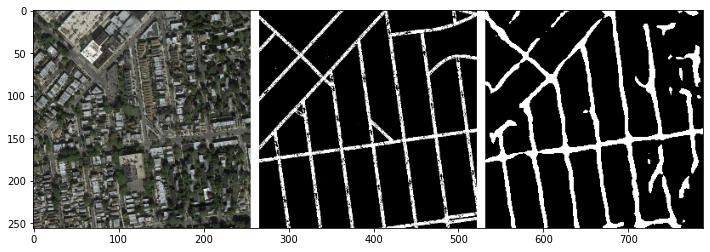

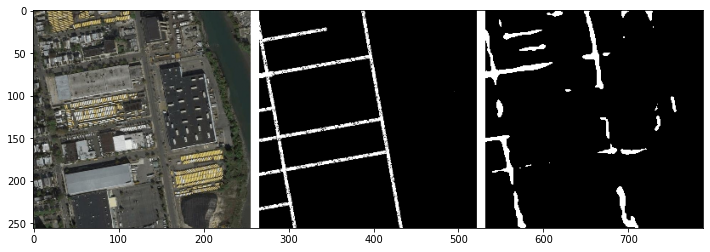

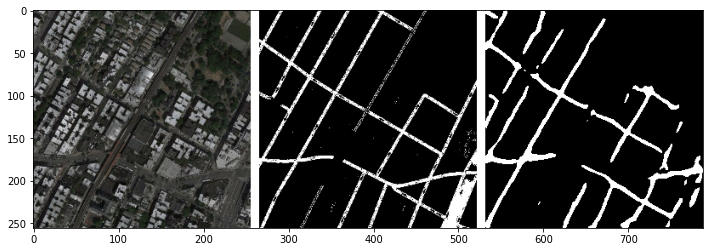

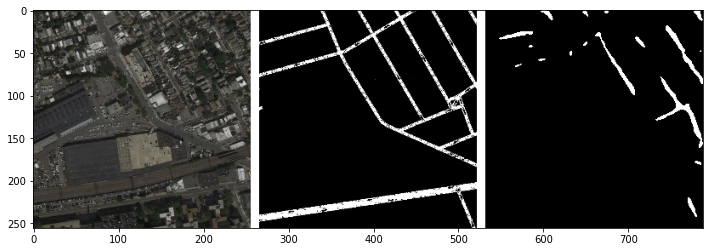

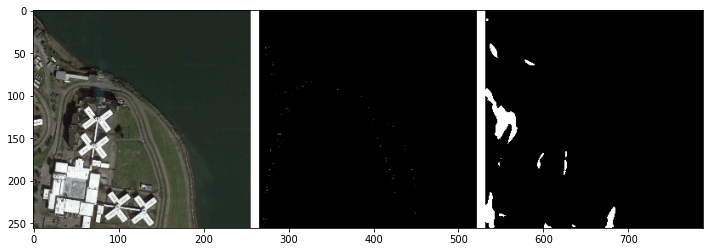

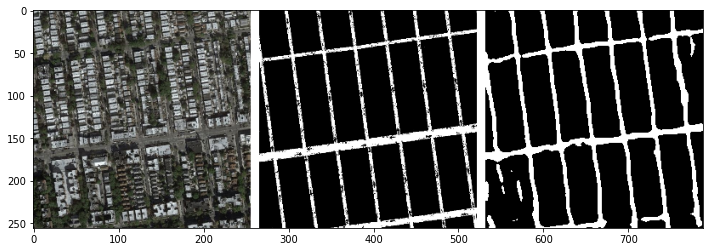

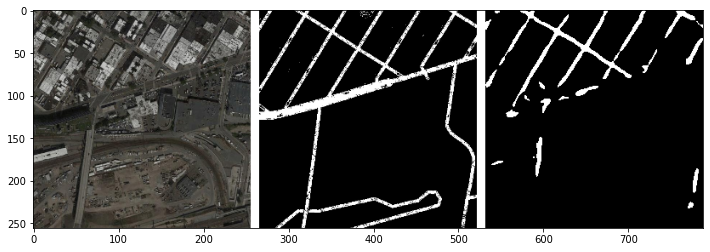

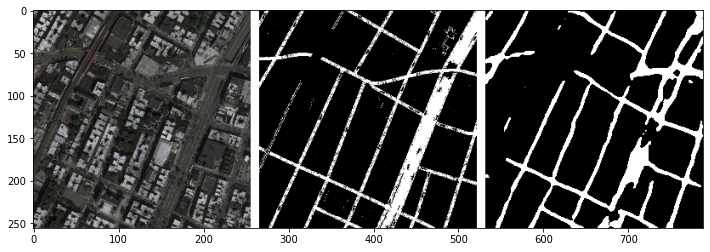

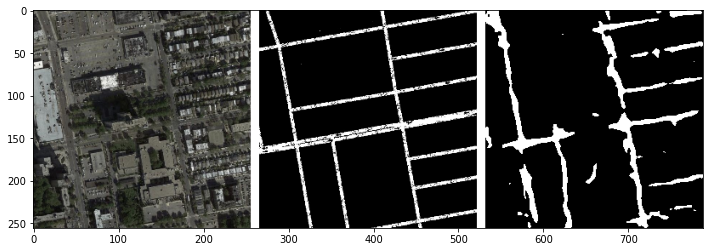

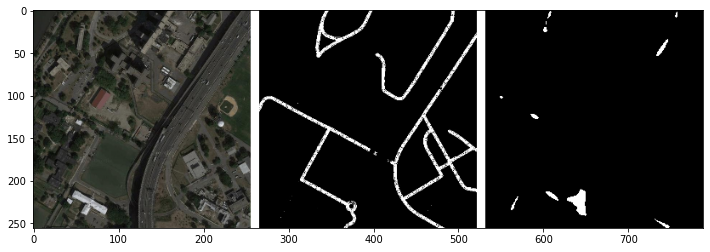

In [72]:
for i, (a, b) in enumerate(zip(x_test[10:20], y_test[10:20])):
    a = read_img(a)
    b = read_mask(b)
    y_pred = model.predict(np.expand_dims(a, axis=0))[0] > 0.5
    h, w, _ = a.shape
    white_line = np.ones((h, 10, 3))

    all_images = [
        a, white_line,
        mask_parse(b), white_line,
        mask_parse(y_pred)
    ]
    image = np.concatenate(all_images, axis=1)
    
    fig = plt.figure(figsize=(12, 12))
    x = fig.add_subplot(1, 1, 1)
    imgplot = plt.imshow(image)


## Better Road with Blues

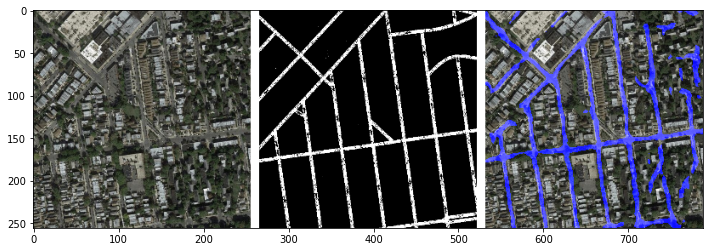

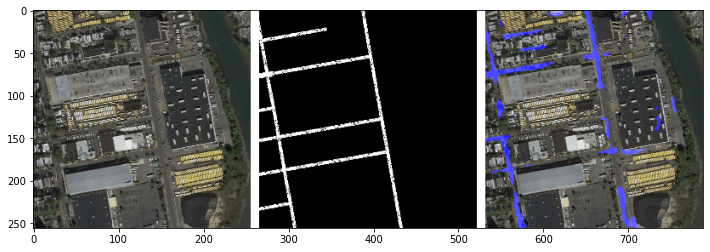

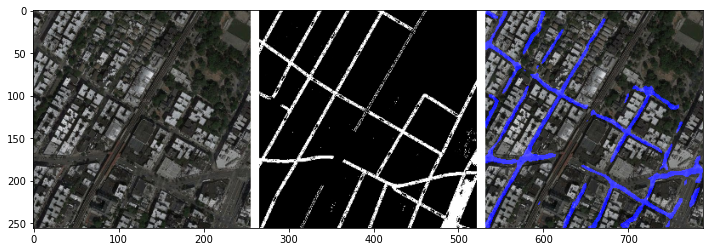

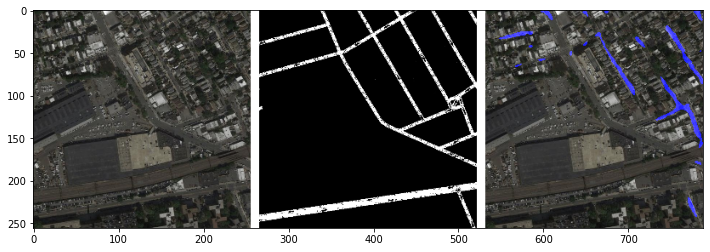

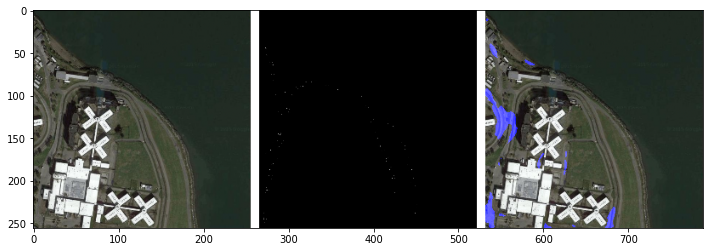

...

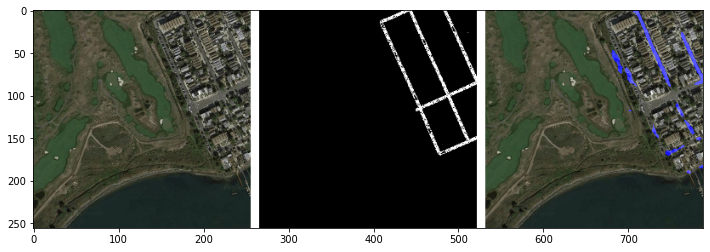

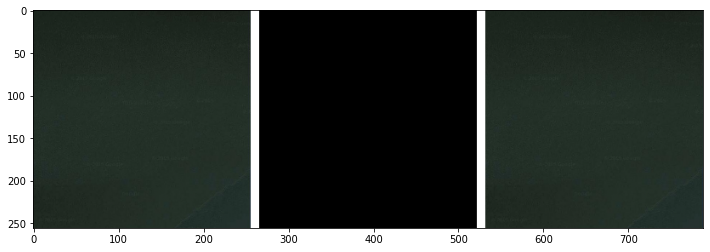

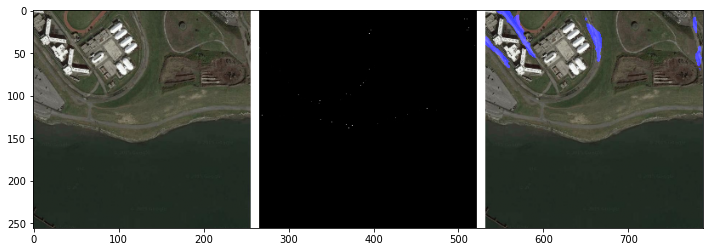

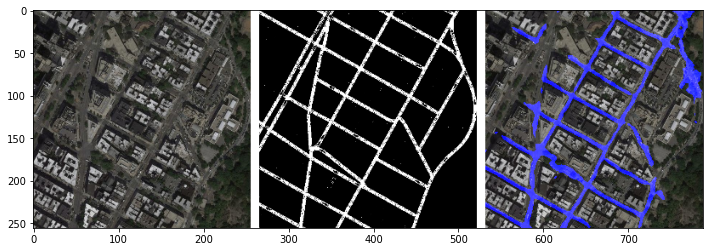

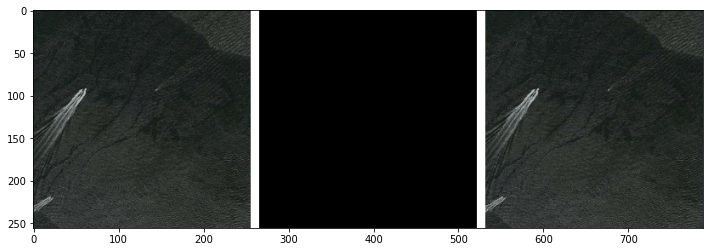

In [75]:
for i, (a, b) in enumerate(zip(x_test[10:30], y_test[10:30])):
    a = read_img(a)
    b = read_mask(b)
    y_pred = model.predict(np.expand_dims(a, axis=0))[0] > 0.5
    #print(y_pred.shape)
    h, w, _ = a.shape
    white_line = np.ones((h, 10, 3))
    mask_red = np.ones((h,w,3))
    mask_red[:,:,0] = a[:,:,0]*.5
    mask_red[:,:,1] = a[:,:,1]*0.5 
    mask_red[:,:,2] = y_pred[:,:,0]*.5 + a[:,:,2]*0.5  
    mask_red = mask_red*2
    mask_red = np.clip(mask_red, 0, 1)
    all_images = [
        a, white_line,
        mask_parse(b), white_line,
        mask_red
        #mask_parse(y_pred)*0.5+a*0.5
    ]
    image = np.concatenate(all_images, axis=1)
    
    fig = plt.figure(figsize=(12, 12))
    x = fig.add_subplot(1, 1, 1)
    imgplot = plt.imshow(image)
